# Model Architecture

In this notebook, i choice best model is optimized CNN with pretrained model and Spatial Transformer layer

Load model saved

In [1]:
import time
import numpy as np
import pandas as pd
from glob import glob

from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Lambda
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential
from keras.layers.normalization import BatchNormalization
from keras import regularizers
from keras import applications
from keras.models import Model
from keras import optimizers
from keras.layers import Input, merge, concatenate
from spatial_transformer import SpatialTransformer

def locnet():
    b = np.zeros((2, 3), dtype='float32')
    b[0, 0] = 1
    b[1, 1] = 1
    W = np.zeros((64, 6), dtype='float32')
    weights = [W, b.flatten()]
    locnet = Sequential()

    locnet.add(Conv2D(16, (7, 7), padding='valid', input_shape=(64, 64, 3)))
    locnet.add(MaxPooling2D(pool_size=(2, 2)))
    locnet.add(Conv2D(32, (5, 5), padding='valid'))
    locnet.add(MaxPooling2D(pool_size=(2, 2)))
    locnet.add(Conv2D(64, (3, 3), padding='valid'))
    locnet.add(MaxPooling2D(pool_size=(2, 2)))

    locnet.add(Flatten())
    locnet.add(Dense(128, activation='elu'))
    locnet.add(Dense(64, activation='elu'))
    locnet.add(Dense(6, weights=weights))

    return locnet

base_model = applications.VGG19(weights='imagenet', 
                                include_top=False, 
                                input_shape=(64, 64, 3))

add_model = Sequential()
add_model.add(Flatten(input_shape=base_model.output_shape[1:]))

added0_model = Model(inputs=base_model.input, outputs=add_model(base_model.output))

stn_model = Sequential()
stn_model.add(Lambda(
    lambda x: 2*x - 1.,
    input_shape=(64, 64, 3),
    output_shape=(64, 64, 3)))
stn_model.add(BatchNormalization())
stn_model.add(SpatialTransformer(localization_net=locnet(),
                                 output_size=(64, 64)))

added_model = Model(inputs=stn_model.input, outputs=added0_model(stn_model.output))

inp = Input(batch_shape=(None, 5))
# out = Dense(8)(inp)
extra_model = Model(input=inp, output=inp)

x = concatenate([added_model.output,
           extra_model.output])

# x = Dropout(0.5)(x)
# x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(1, activation='sigmoid')(x)

model =  Model(input=[added_model.input,
                extra_model.input],
                output=x)

model.load_weights('saved_models/VGG19_CNN_small.best.from_scratch.hdf5')

Using TensorFlow backend.


Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


C:\Users\rlawn\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("in...)`
C:\Users\rlawn\Anaconda3\lib\site-packages\ipykernel_launcher.py:75: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=[<tf.Tenso..., outputs=Tensor("de...)`


This fuction bellow resize and convert images to numpy array

In [2]:
from keras.preprocessing import image 

def path_to_tensor(img_path, shape=(64, 64)):
    # loads RGB image as PIL.Image.Image type
    img = image.load_img(img_path, target_size=shape)
    # convert PIL.Image.Image type to 3D tensor with shape (224, 224, 3)
    x = image.img_to_array(img)/255
    # convert 3D tensor to 4D tensor with shape (1, 224, 224, 3) and return 4D tensor
    return np.vstack([np.expand_dims(x, axis=0)])

And function to preprocessing extra data

In [20]:
def features_preprocessing(age, gender, view):
    
    if age == 35:
        return np.array([[age,0,1,1,0]])

    agetype = age[-1]
    age = int(age[:-1])
    age = {
              'Y': lambda x: x,
              'M': lambda x: x / 12.,
              'D': lambda x: x / 365.
            }[agetype](age)
    if (gender == 'M'):
        m = 1
        f = 0
    else:
        m = 0
        f = 1
        
    if (view == 'AP'):
        ap = 1
        pa = 0
    else:
        ap = 0
        pa = 1
    return np.array([[age, f, m, ap, pa]])

In [21]:
def predict(img, age, gender, view):
    return model.predict([path_to_tensor(img), features_preprocessing(age, gender, view)])

In [22]:
import matplotlib.pyplot as plt 
import cv2
%matplotlib inline

def show_image(img_path):
    image = cv2.imread(img_path)
    plt.imshow(image)
    plt.show()

I will test with 20 random samples

Image :  images/JPCLN050.png


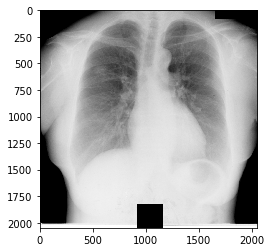

True: i don't know, Predict: No Finding, confident: 0.31307137
Image :  images/JPCLN051.png


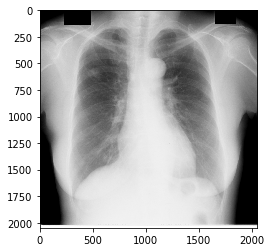

True: i don't know, Predict: No Finding, confident: 0.4032372
Image :  images/JPCLN052.png


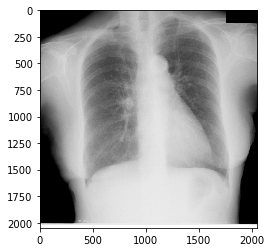

True: i don't know, Predict: No Finding, confident: 0.38075393
Image :  images/JPCLN053.png


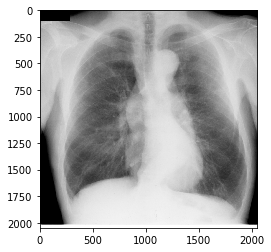

True: i don't know, Predict: No Finding, confident: 0.34926146
Image :  images/JPCLN054.png


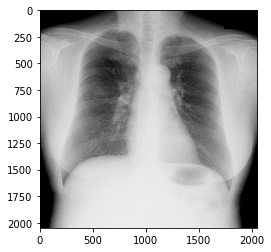

True: i don't know, Predict: No Finding, confident: 0.1286759
Image :  images/JPCLN055.png


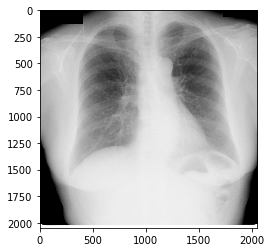

True: i don't know, Predict: No Finding, confident: 0.32809895
Image :  images/JPCLN056.png


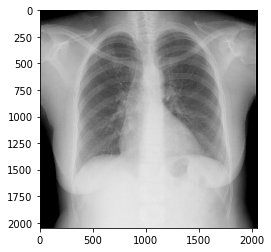

True: i don't know, Predict: No Finding, confident: 0.15965298
Image :  images/JPCLN057.png


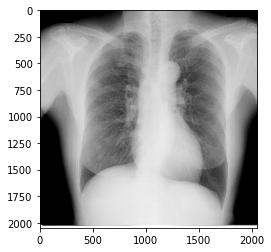

True: i don't know, Predict: No Finding, confident: 0.22508907
Image :  images/JPCLN058.png


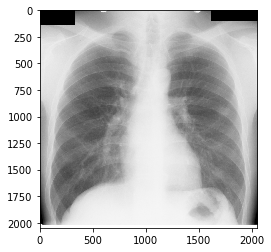

True: i don't know, Predict: No Finding, confident: 0.12691873
Image :  images/JPCLN059.png


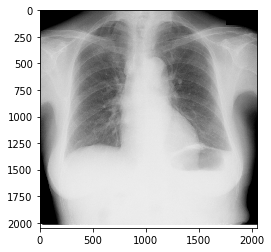

True: i don't know, Predict: No Finding, confident: 0.36332312
Image :  images/JPCLN060.png


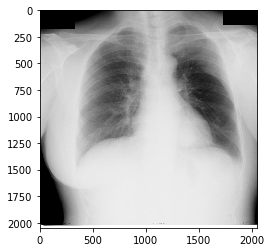

True: i don't know, Predict: No Finding, confident: 0.45007116
Image :  images/JPCLN061.png


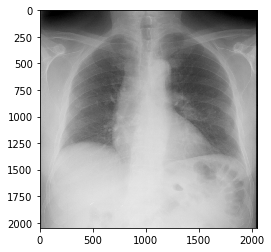

True: i don't know, Predict: No Finding, confident: 0.23040365
Image :  images/JPCLN062.png


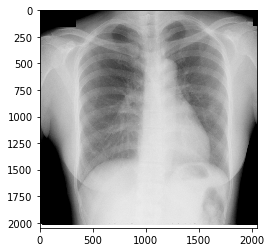

True: i don't know, Predict: No Finding, confident: 0.2388492
Image :  images/JPCLN063.png


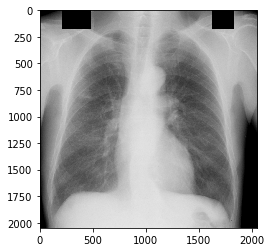

True: i don't know, Predict: Finding, confident: 0.5059038
Image :  images/JPCLN064.png


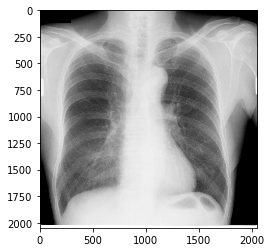

True: i don't know, Predict: No Finding, confident: 0.26232666
Image :  images/JPCLN065.png


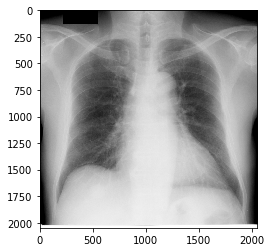

True: i don't know, Predict: No Finding, confident: 0.23156518
Image :  images/JPCLN066.png


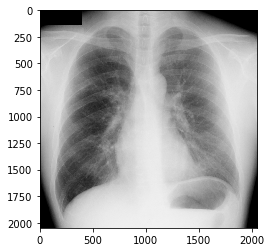

True: i don't know, Predict: No Finding, confident: 0.47115755
Image :  images/JPCLN067.png


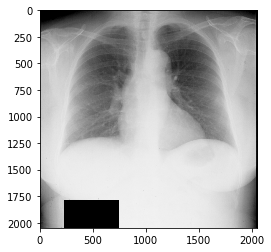

True: i don't know, Predict: No Finding, confident: 0.19489461
Image :  images/JPCLN068.png


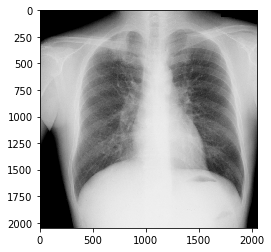

True: i don't know, Predict: No Finding, confident: 0.2789364
Image :  images/JPCLN069.png


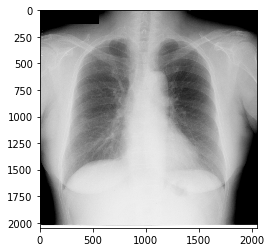

True: i don't know, Predict: No Finding, confident: 0.33928207
Image :  images/JPCLN070.png


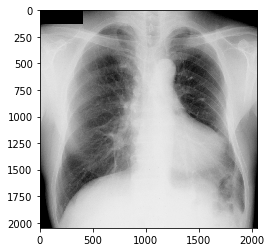

True: i don't know, Predict: Finding, confident: 0.5635576
Image :  images/JPCLN071.png


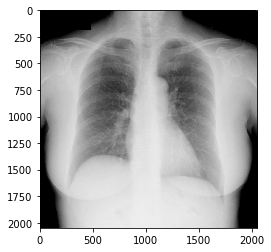

True: i don't know, Predict: No Finding, confident: 0.18901512
Image :  images/JPCLN072.png


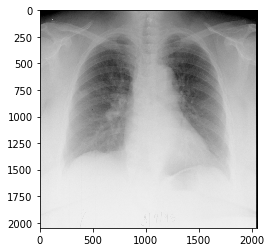

True: i don't know, Predict: No Finding, confident: 0.19943918
Image :  images/JPCLN073.png


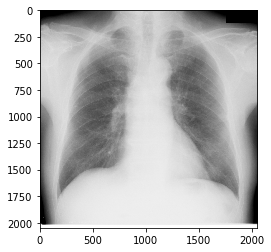

True: i don't know, Predict: No Finding, confident: 0.23179077
Image :  images/JPCLN074.png


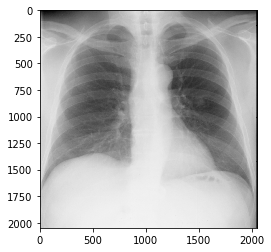

True: i don't know, Predict: No Finding, confident: 0.1420502
Image :  images/JPCLN075.png


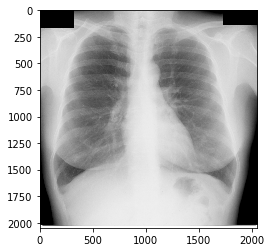

True: i don't know, Predict: No Finding, confident: 0.1101871
Image :  images/JPCLN076.png


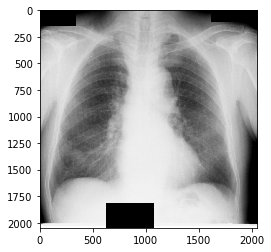

True: i don't know, Predict: Finding, confident: 0.55941665
Image :  images/JPCLN077.png


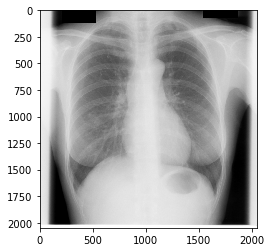

True: i don't know, Predict: No Finding, confident: 0.08849478
Image :  images/JPCLN078.png


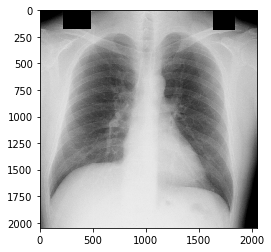

True: i don't know, Predict: No Finding, confident: 0.10837326
Image :  images/JPCLN079.png


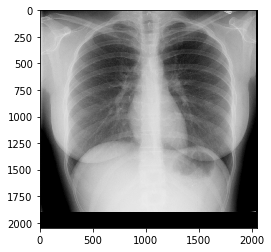

True: i don't know, Predict: No Finding, confident: 0.05094965
Image :  images/JPCLN080.png


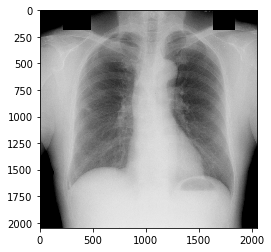

True: i don't know, Predict: No Finding, confident: 0.16527286
Image :  images/JPCLN081.png


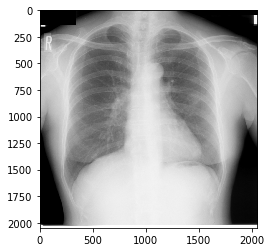

True: i don't know, Predict: No Finding, confident: 0.26856592
Image :  images/JPCLN082.png


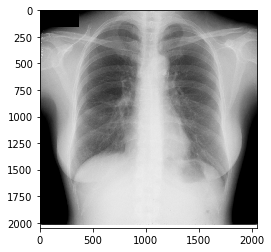

True: i don't know, Predict: No Finding, confident: 0.23336437
Image :  images/JPCLN083.png


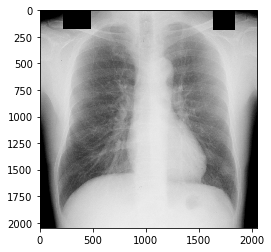

True: i don't know, Predict: No Finding, confident: 0.14240667
Image :  images/JPCLN084.png


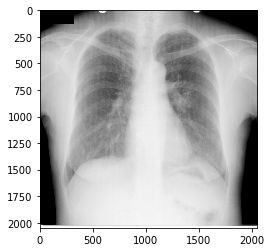

True: i don't know, Predict: No Finding, confident: 0.17058672
Image :  images/JPCLN085.png


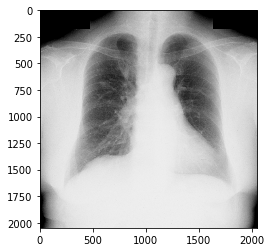

True: i don't know, Predict: No Finding, confident: 0.3686054
Image :  images/JPCLN086.png


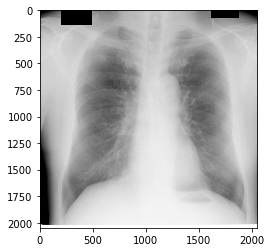

True: i don't know, Predict: No Finding, confident: 0.2862943
Image :  images/JPCLN087.png


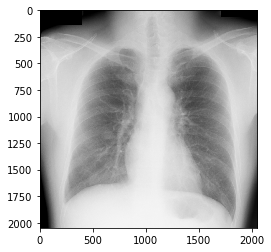

True: i don't know, Predict: No Finding, confident: 0.22715183
Image :  images/JPCLN088.png


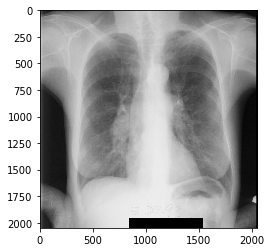

True: i don't know, Predict: No Finding, confident: 0.44156137
Image :  images/JPCLN089.png


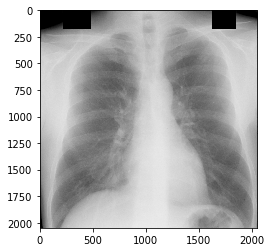

True: i don't know, Predict: No Finding, confident: 0.08992804
Image :  images/JPCLN090.png


OSError: image file is truncated (0 bytes not processed)

In [25]:
import os

df = pd.read_csv('sample/sample_labels.csv').sample(300)

path_dir = 'images'
file_list = os.listdir(path_dir)

count = 0
for i in file_list:
    if count == 240:
        break
    if count >=100:
        img, age, gender, view = 'images/' + i, df.iloc[count]['Patient Age'], df.iloc[count]['Patient Gender'], df.iloc[count]['View Position']
        print("Image : " , img)
        age = 35
        pre = predict(img, age, gender, view)[0][0]
        show_image(img)
        y_predict = "Finding" if (pre >= 0.5) else "No Finding"
        print ("True: %s, Predict: %s, confident: %s" % ("i don't know", y_predict, pre))
    count += 1



Image :  sample/images/00021687_002.png
View :  PA


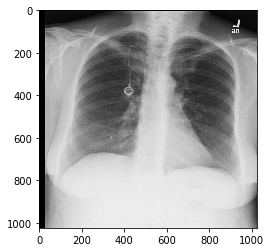

True: No Finding, Predict: No Finding, confident: 0.26237255
Image :  sample/images/00023632_000.png
View :  PA


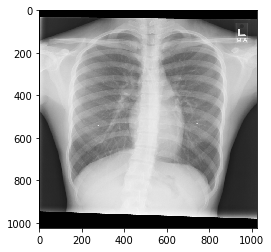

True: No Finding, Predict: No Finding, confident: 0.07115995
Image :  sample/images/00013071_004.png
View :  PA


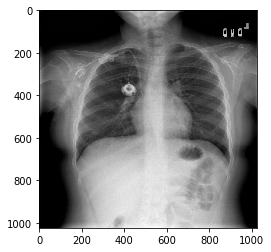

True: No Finding, Predict: No Finding, confident: 0.17435622
Image :  sample/images/00010060_038.png
View :  AP


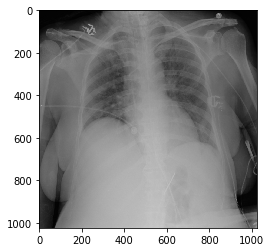

True: No Finding, Predict: No Finding, confident: 0.23380762
Image :  sample/images/00018319_003.png
View :  AP


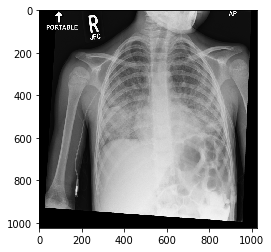

True: Infiltration, Predict: Finding, confident: 0.7595225
Image :  sample/images/00028505_012.png
View :  PA


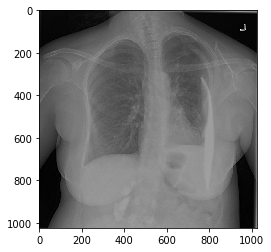

True: Pleural_Thickening, Predict: Finding, confident: 0.5613166
Image :  sample/images/00026235_000.png
View :  PA


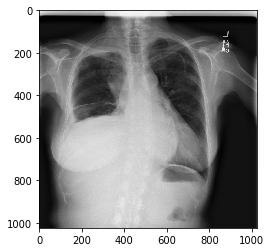

True: Effusion|Mass, Predict: Finding, confident: 0.6998192
Image :  sample/images/00022572_053.png
View :  PA


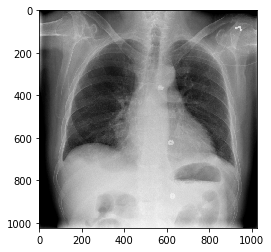

True: Cardiomegaly|Effusion, Predict: Finding, confident: 0.6065914
Image :  sample/images/00018253_063.png
View :  AP


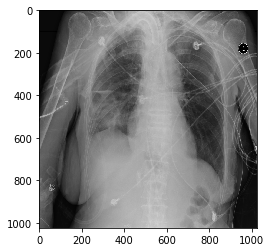

True: Infiltration, Predict: Finding, confident: 0.7052168
Image :  sample/images/00008888_014.png
View :  PA


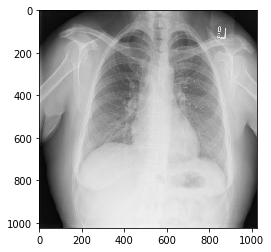

True: No Finding, Predict: No Finding, confident: 0.22267205
Image :  sample/images/00011379_029.png
View :  PA


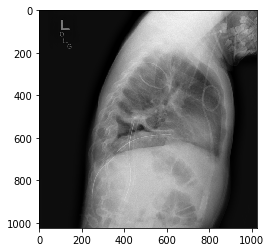

True: Pleural_Thickening|Pneumothorax, Predict: Finding, confident: 0.5892435
Image :  sample/images/00016587_055.png
View :  PA


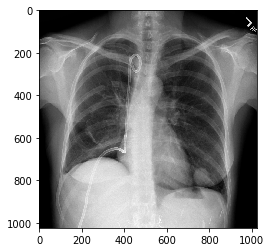

True: Mass|Pneumothorax, Predict: Finding, confident: 0.8280949
Image :  sample/images/00001194_006.png
View :  AP


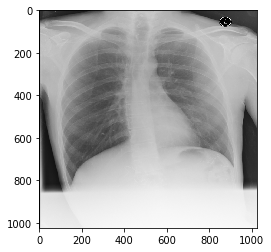

True: No Finding, Predict: No Finding, confident: 0.06011663
Image :  sample/images/00001248_017.png
View :  PA


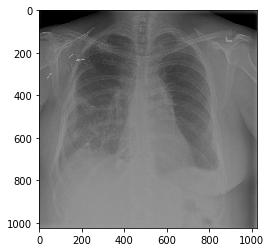

True: Effusion, Predict: Finding, confident: 0.5660118
Image :  sample/images/00019999_002.png
View :  PA


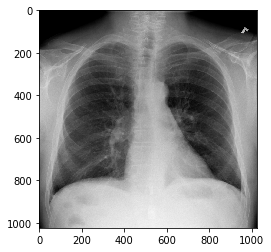

True: Atelectasis|Nodule, Predict: Finding, confident: 0.5149494
Image :  sample/images/00002543_000.png
View :  PA


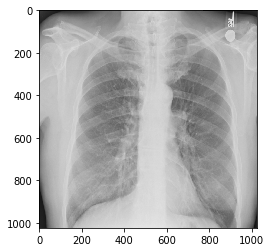

True: No Finding, Predict: No Finding, confident: 0.42695153
Image :  sample/images/00028518_020.png
View :  AP


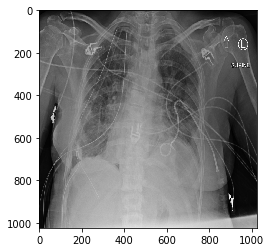

True: Atelectasis|Effusion|Pleural_Thickening, Predict: Finding, confident: 0.6778527
Image :  sample/images/00015007_009.png
View :  PA


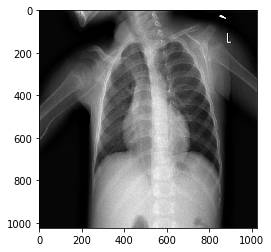

True: No Finding, Predict: No Finding, confident: 0.3800009
Image :  sample/images/00002395_016.png
View :  AP


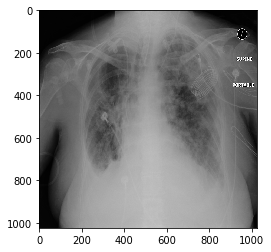

True: Effusion|Infiltration, Predict: Finding, confident: 0.7489786
Image :  sample/images/00006925_007.png
View :  AP


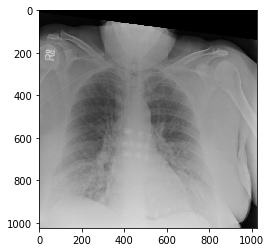

True: No Finding, Predict: No Finding, confident: 0.10131674
Image :  sample/images/00014365_000.png
View :  PA


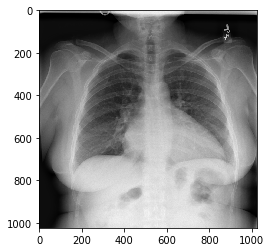

True: Cardiomegaly, Predict: Finding, confident: 0.65591043
Image :  sample/images/00022830_001.png
View :  PA


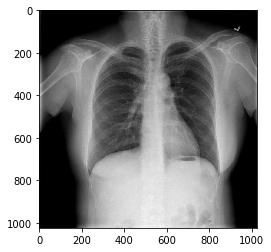

True: No Finding, Predict: No Finding, confident: 0.19416185
Image :  sample/images/00009281_014.png
View :  PA


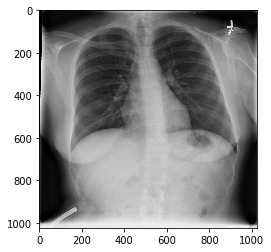

True: No Finding, Predict: No Finding, confident: 0.11685768
Image :  sample/images/00003719_006.png
View :  PA


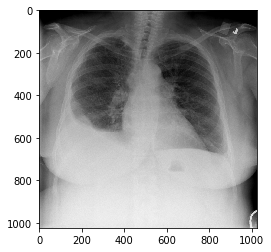

True: Effusion, Predict: Finding, confident: 0.84771246
Image :  sample/images/00027630_001.png
View :  PA


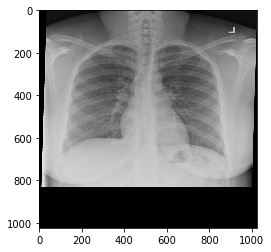

True: No Finding, Predict: No Finding, confident: 0.15134172
Image :  sample/images/00004065_008.png
View :  AP


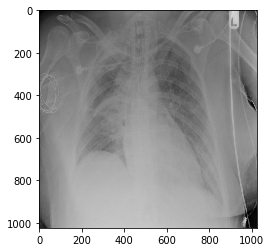

True: Fibrosis|Infiltration, Predict: Finding, confident: 0.5290354
Image :  sample/images/00001088_010.png
View :  AP


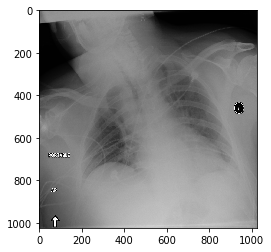

True: No Finding, Predict: No Finding, confident: 0.30317
Image :  sample/images/00011731_002.png
View :  AP


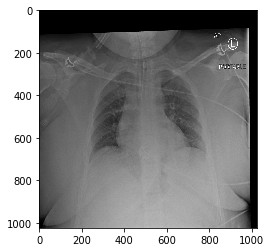

True: No Finding, Predict: No Finding, confident: 0.19230549
Image :  sample/images/00014492_000.png
View :  PA


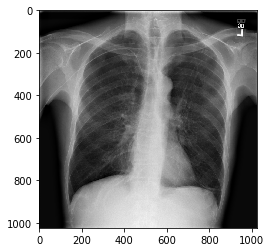

True: No Finding, Predict: No Finding, confident: 0.42823726
Image :  sample/images/00029124_001.png
View :  PA


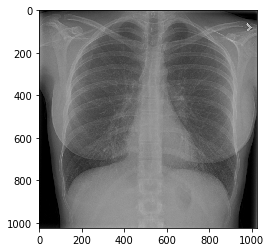

True: No Finding, Predict: No Finding, confident: 0.13348553
Image :  sample/images/00027337_000.png
View :  PA


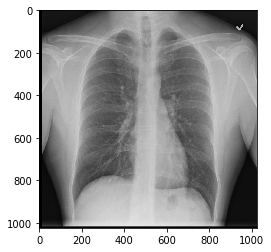

True: No Finding, Predict: No Finding, confident: 0.24964336
Image :  sample/images/00005053_001.png
View :  PA


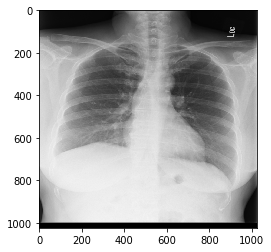

True: No Finding, Predict: No Finding, confident: 0.094389096
Image :  sample/images/00021123_000.png
View :  PA


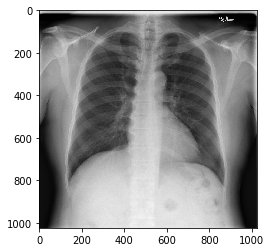

True: No Finding, Predict: No Finding, confident: 0.13265522
Image :  sample/images/00008925_001.png
View :  PA


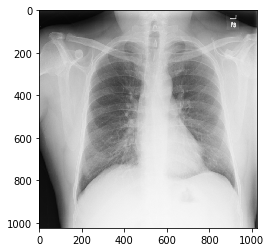

True: No Finding, Predict: No Finding, confident: 0.11511977
Image :  sample/images/00025117_002.png
View :  PA


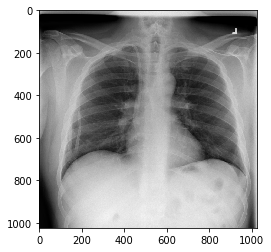

True: No Finding, Predict: No Finding, confident: 0.14791737
Image :  sample/images/00021917_000.png
View :  AP


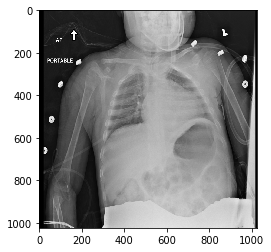

True: No Finding, Predict: No Finding, confident: 0.27597827
Image :  sample/images/00020287_000.png
View :  PA


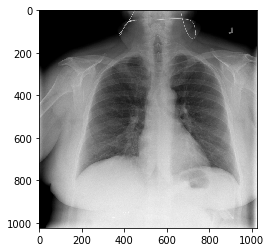

True: No Finding, Predict: No Finding, confident: 0.14806539
Image :  sample/images/00011723_013.png
View :  AP


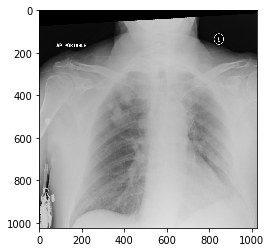

True: No Finding, Predict: No Finding, confident: 0.19160296
Image :  sample/images/00020680_005.png
View :  PA


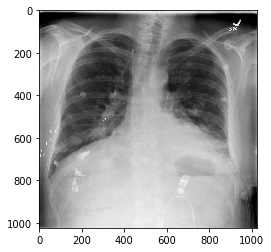

True: Atelectasis|Consolidation|Nodule|Pleural_Thickening|Pneumothorax, Predict: Finding, confident: 0.8757717
Image :  sample/images/00030169_000.png
View :  PA


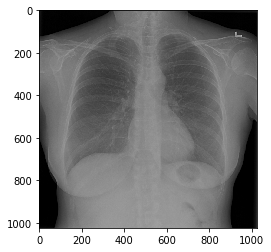

True: No Finding, Predict: No Finding, confident: 0.14075689
Image :  sample/images/00022762_000.png
View :  PA


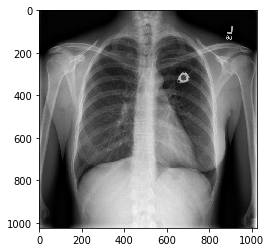

True: No Finding, Predict: No Finding, confident: 0.16778584
Image :  sample/images/00014387_007.png
View :  PA


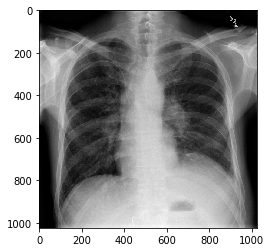

True: Infiltration, Predict: Finding, confident: 0.6626479
Image :  sample/images/00011048_001.png
View :  PA


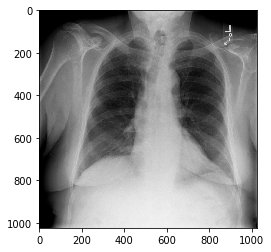

True: No Finding, Predict: No Finding, confident: 0.2138106
Image :  sample/images/00011116_000.png
View :  PA


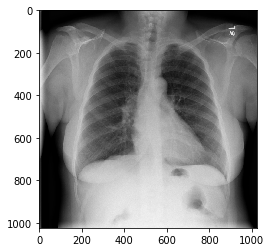

True: No Finding, Predict: No Finding, confident: 0.24302363
Image :  sample/images/00026073_003.png
View :  PA


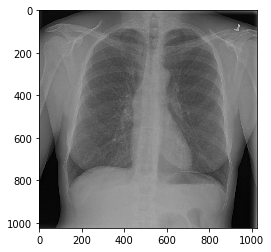

True: No Finding, Predict: No Finding, confident: 0.11190101
Image :  sample/images/00021715_000.png
View :  PA


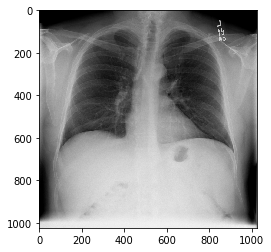

True: No Finding, Predict: No Finding, confident: 0.15473974
Image :  sample/images/00018403_001.png
View :  PA


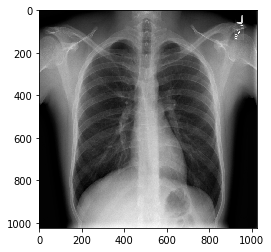

True: No Finding, Predict: No Finding, confident: 0.21429248
Image :  sample/images/00006269_000.png
View :  PA


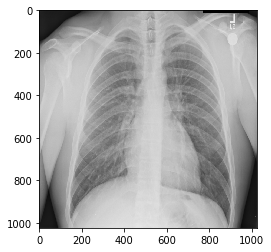

True: No Finding, Predict: No Finding, confident: 0.06854509
Image :  sample/images/00023816_000.png
View :  PA


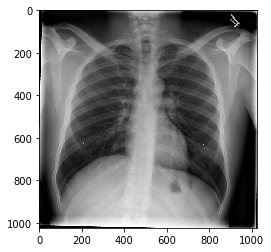

True: No Finding, Predict: No Finding, confident: 0.064478904
Image :  sample/images/00001718_002.png
View :  PA


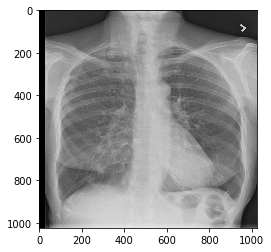

True: No Finding, Predict: No Finding, confident: 0.38542125
Image :  sample/images/00020363_001.png
View :  PA


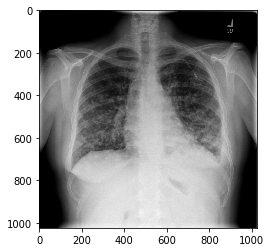

True: Pleural_Thickening, Predict: Finding, confident: 0.8126884
Image :  sample/images/00011315_001.png
View :  PA


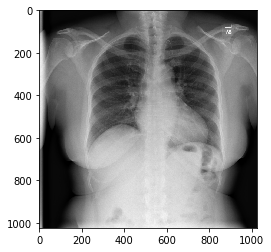

True: No Finding, Predict: No Finding, confident: 0.30461738
Image :  sample/images/00025849_037.png
View :  AP


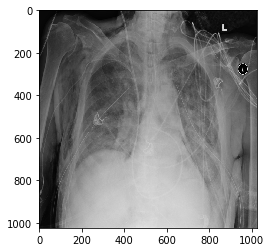

True: Infiltration, Predict: Finding, confident: 0.7555807
Image :  sample/images/00023587_000.png
View :  PA


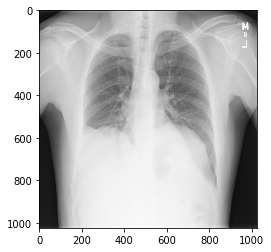

True: No Finding, Predict: No Finding, confident: 0.4943025
Image :  sample/images/00009798_000.png
View :  PA


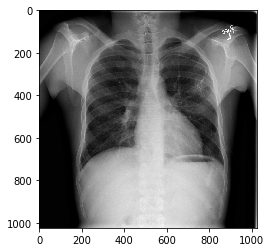

True: No Finding, Predict: No Finding, confident: 0.409305
Image :  sample/images/00020607_001.png
View :  PA


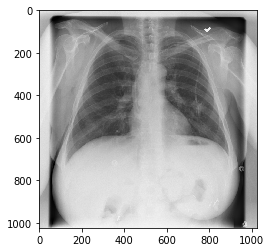

True: No Finding, Predict: No Finding, confident: 0.17279576
Image :  sample/images/00006304_011.png
View :  AP


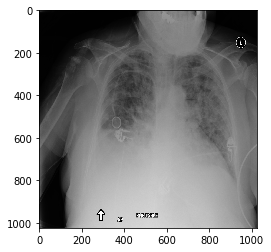

True: Infiltration|Nodule|Pleural_Thickening, Predict: Finding, confident: 0.78500783
Image :  sample/images/00011955_000.png
View :  AP


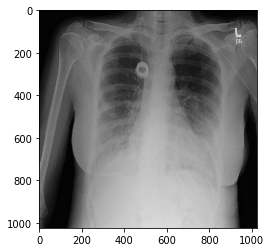

True: Pleural_Thickening, Predict: Finding, confident: 0.76900387
Image :  sample/images/00014022_094.png
View :  AP


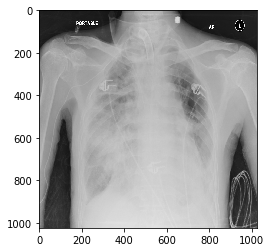

True: Consolidation|Effusion, Predict: Finding, confident: 0.61697674
Image :  sample/images/00016205_006.png
View :  PA


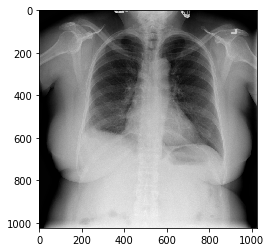

True: No Finding, Predict: No Finding, confident: 0.3411218
Image :  sample/images/00014024_003.png
View :  AP


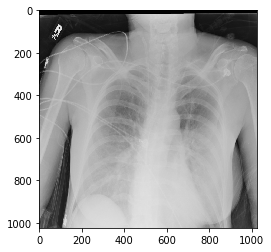

True: No Finding, Predict: No Finding, confident: 0.41523248
Image :  sample/images/00010060_042.png
View :  AP


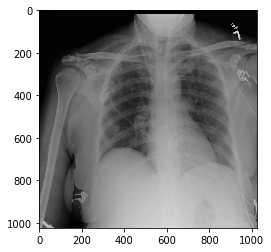

True: No Finding, Predict: No Finding, confident: 0.18398535
Image :  sample/images/00009584_000.png
View :  PA


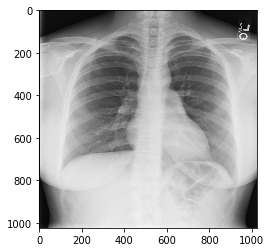

True: No Finding, Predict: No Finding, confident: 0.14612289
Image :  sample/images/00005994_000.png
View :  PA


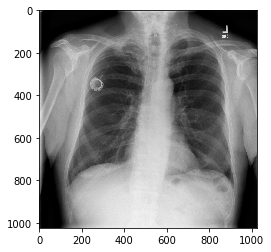

True: No Finding, Predict: No Finding, confident: 0.308823
Image :  sample/images/00016064_019.png
View :  PA


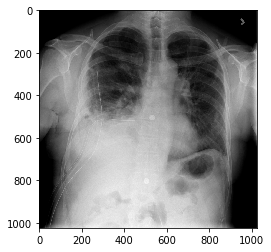

True: Infiltration, Predict: Finding, confident: 0.82374054
Image :  sample/images/00001697_000.png
View :  PA


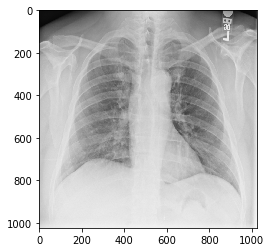

True: No Finding, Predict: No Finding, confident: 0.22259587
Image :  sample/images/00017266_003.png
View :  PA


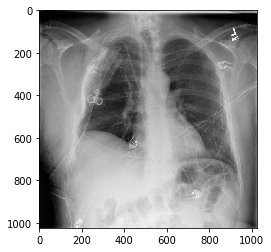

True: Emphysema, Predict: Finding, confident: 0.60769117
Image :  sample/images/00015700_021.png
View :  PA


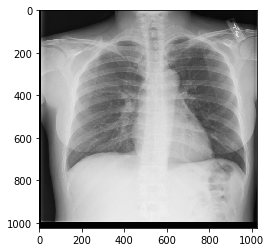

True: No Finding, Predict: No Finding, confident: 0.124876
Image :  sample/images/00030346_001.png
View :  AP


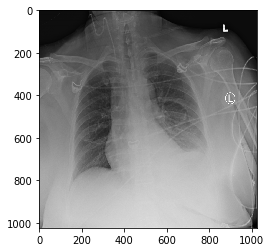

True: Atelectasis|Consolidation, Predict: Finding, confident: 0.784458
Image :  sample/images/00019373_061.png
View :  PA


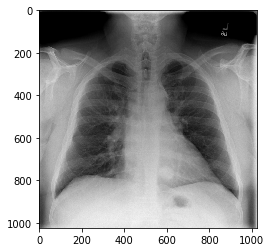

True: No Finding, Predict: No Finding, confident: 0.36340982
Image :  sample/images/00027278_008.png
View :  PA


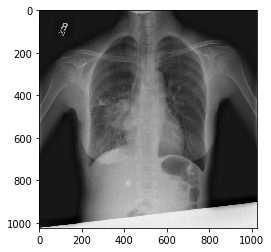

True: Infiltration|Pneumothorax, Predict: Finding, confident: 0.7862743
Image :  sample/images/00004427_001.png
View :  AP


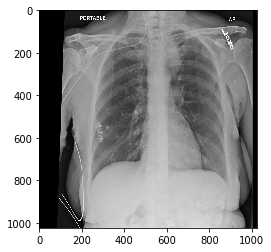

True: No Finding, Predict: No Finding, confident: 0.11159194
Image :  sample/images/00029105_001.png
View :  PA


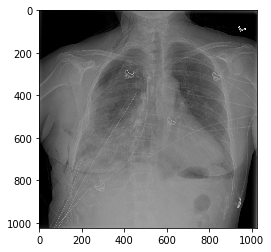

True: Atelectasis|Effusion|Infiltration|Pneumothorax, Predict: Finding, confident: 0.7494538
Image :  sample/images/00006626_006.png
View :  PA


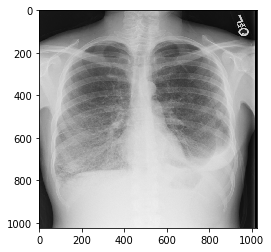

True: Effusion, Predict: Finding, confident: 0.6421927
Image :  sample/images/00002571_000.png
View :  PA


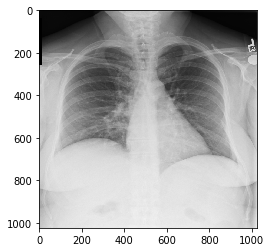

True: No Finding, Predict: No Finding, confident: 0.12363927
Image :  sample/images/00009101_000.png
View :  AP


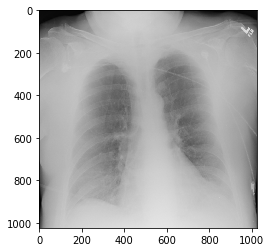

True: No Finding, Predict: No Finding, confident: 0.3124417
Image :  sample/images/00029105_023.png
View :  PA


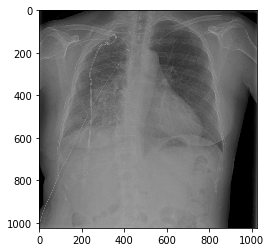

True: Infiltration|Pleural_Thickening, Predict: Finding, confident: 0.73058105
Image :  sample/images/00009218_018.png
View :  AP


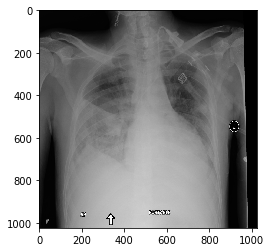

True: Effusion|Infiltration, Predict: Finding, confident: 0.9020942
Image :  sample/images/00021840_009.png
View :  PA


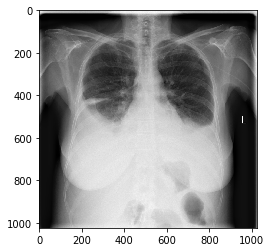

True: Effusion|Infiltration, Predict: Finding, confident: 0.8533941
Image :  sample/images/00001086_001.png
View :  PA


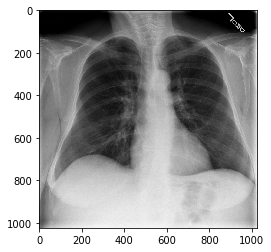

True: No Finding, Predict: No Finding, confident: 0.32261664
Image :  sample/images/00023487_008.png
View :  PA


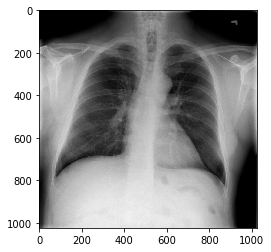

True: No Finding, Predict: No Finding, confident: 0.1967701
Image :  sample/images/00005722_014.png
View :  PA


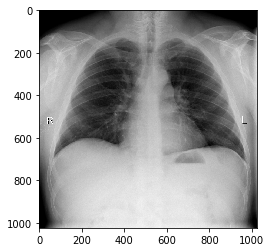

True: No Finding, Predict: No Finding, confident: 0.25894725
Image :  sample/images/00024383_000.png
View :  PA


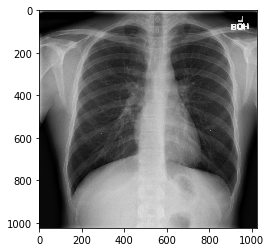

True: No Finding, Predict: No Finding, confident: 0.15955594
Image :  sample/images/00007034_048.png
View :  AP


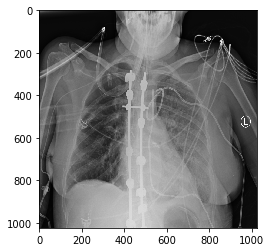

True: Effusion, Predict: Finding, confident: 0.6610529
Image :  sample/images/00009231_004.png
View :  PA


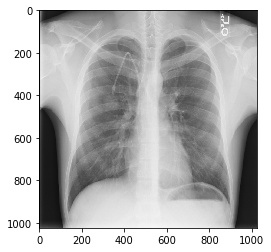

True: No Finding, Predict: No Finding, confident: 0.14126712
Image :  sample/images/00007090_004.png
View :  PA


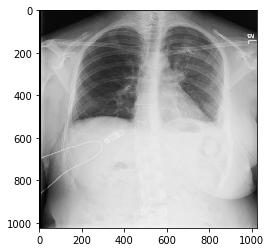

True: Effusion|Pneumothorax, Predict: Finding, confident: 0.7115826
Image :  sample/images/00018043_006.png
View :  PA


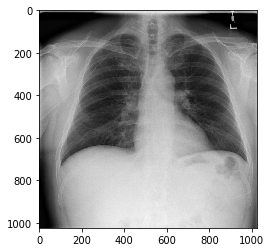

True: No Finding, Predict: No Finding, confident: 0.30923387
Image :  sample/images/00014203_051.png
View :  AP


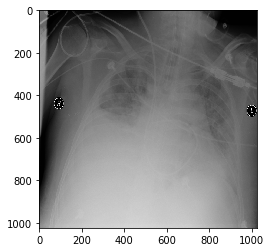

True: Consolidation|Mass, Predict: Finding, confident: 0.8171606
Image :  sample/images/00013616_000.png
View :  PA


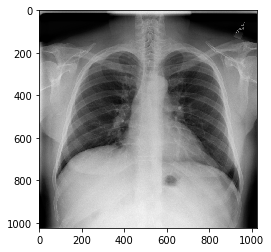

True: No Finding, Predict: No Finding, confident: 0.15587303
Image :  sample/images/00005288_003.png
View :  AP


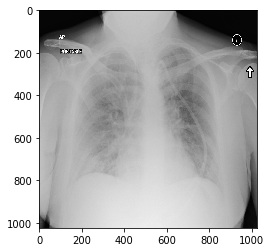

True: Edema|Infiltration, Predict: Finding, confident: 0.5733646
Image :  sample/images/00024025_000.png
View :  PA


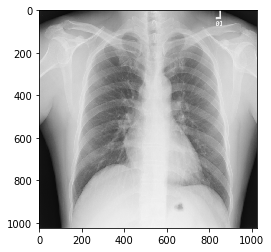

True: No Finding, Predict: No Finding, confident: 0.07613221
Image :  sample/images/00009608_014.png
View :  AP


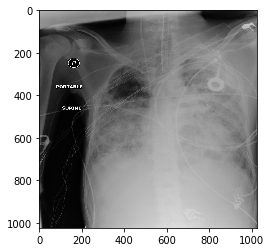

True: Effusion, Predict: Finding, confident: 0.73952657
Image :  sample/images/00005853_006.png
View :  AP


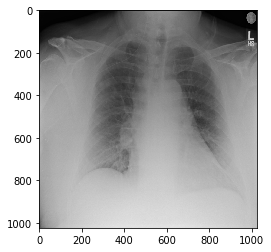

True: No Finding, Predict: No Finding, confident: 0.134561
Image :  sample/images/00001977_003.png
View :  PA


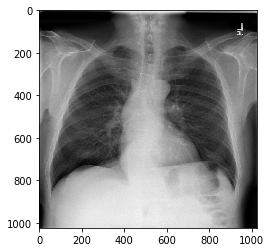

True: No Finding, Predict: No Finding, confident: 0.22829743
Image :  sample/images/00021170_003.png
View :  AP


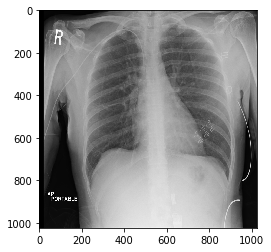

True: No Finding, Predict: No Finding, confident: 0.049995404
Image :  sample/images/00013890_007.png
View :  PA


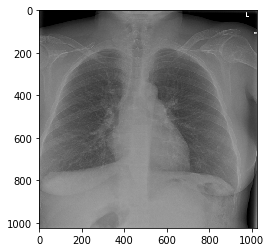

True: No Finding, Predict: No Finding, confident: 0.3612562
Image :  sample/images/00013214_001.png
View :  PA


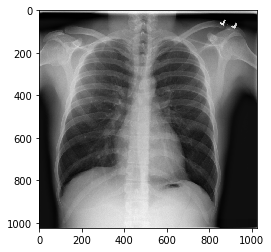

True: No Finding, Predict: No Finding, confident: 0.121604666
Image :  sample/images/00006569_000.png
View :  PA


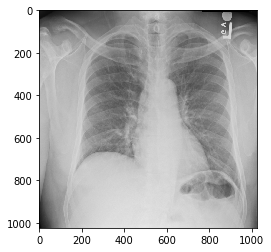

True: No Finding, Predict: No Finding, confident: 0.23723595
Image :  sample/images/00013031_005.png
View :  AP


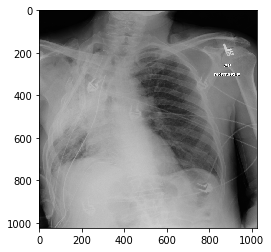

True: Effusion|Pneumothorax, Predict: Finding, confident: 0.54185843
Image :  sample/images/00013774_000.png
View :  PA


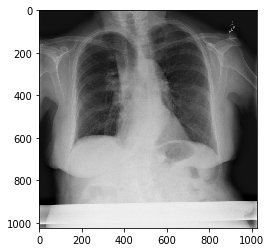

True: Consolidation, Predict: Finding, confident: 0.59031
Image :  sample/images/00015184_000.png
View :  PA


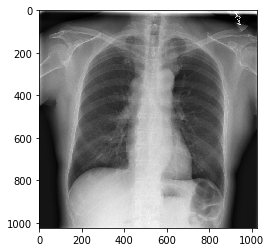

True: No Finding, Predict: No Finding, confident: 0.1855888
Image :  sample/images/00003064_045.png
View :  PA


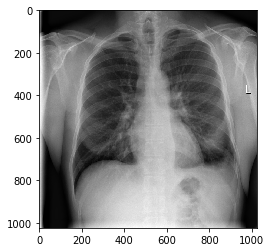

True: No Finding, Predict: No Finding, confident: 0.3758105
Image :  sample/images/00001445_003.png
View :  PA


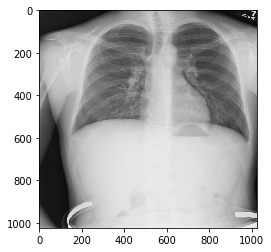

True: No Finding, Predict: No Finding, confident: 0.19875729
Image :  sample/images/00017467_006.png
View :  PA


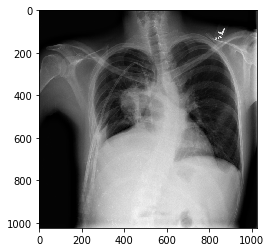

True: Effusion|Mass, Predict: Finding, confident: 0.78919935
Image :  sample/images/00009404_000.png
View :  PA


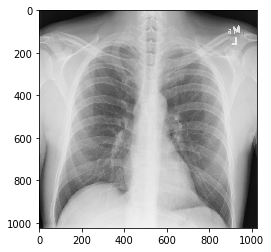

True: No Finding, Predict: No Finding, confident: 0.108428456
Image :  sample/images/00022780_000.png
View :  PA


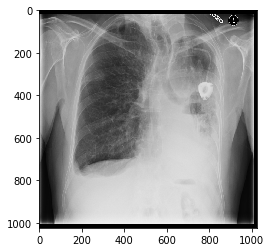

True: Effusion, Predict: Finding, confident: 0.743147
Image :  sample/images/00022281_000.png
View :  PA


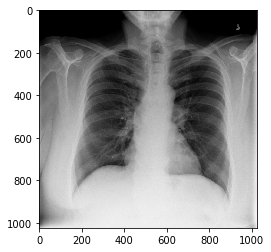

True: No Finding, Predict: No Finding, confident: 0.19741137
Image :  sample/images/00013890_013.png
View :  PA


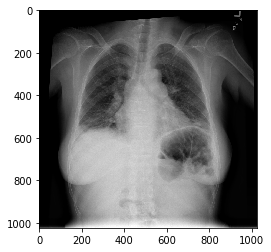

True: Cardiomegaly|Effusion|Infiltration, Predict: Finding, confident: 0.75506186
Image :  sample/images/00006684_000.png
View :  PA


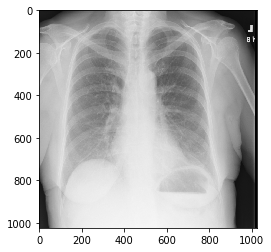

True: No Finding, Predict: No Finding, confident: 0.24275032
Image :  sample/images/00001775_001.png
View :  PA


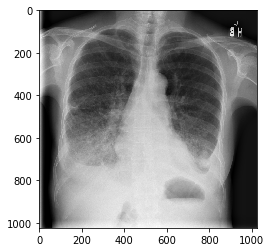

True: Effusion, Predict: Finding, confident: 0.88510275
Image :  sample/images/00016497_001.png
View :  AP


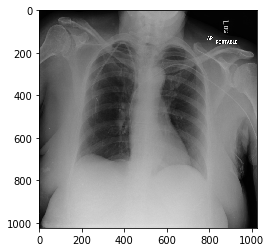

True: No Finding, Predict: No Finding, confident: 0.21115324
Image :  sample/images/00016736_001.png
View :  PA


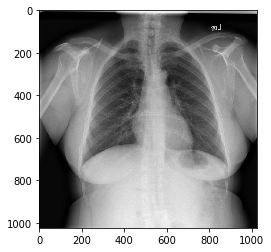

True: No Finding, Predict: No Finding, confident: 0.07692196
Image :  sample/images/00012932_000.png
View :  PA


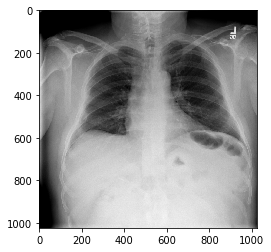

True: No Finding, Predict: No Finding, confident: 0.24060504
Image :  sample/images/00028131_006.png
View :  AP


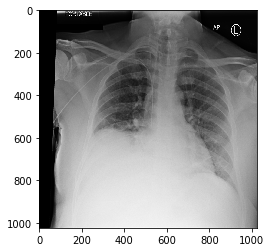

True: Effusion|Infiltration, Predict: Finding, confident: 0.72450644
Image :  sample/images/00028504_000.png
View :  PA


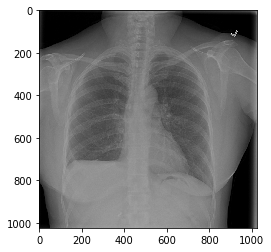

True: No Finding, Predict: No Finding, confident: 0.29343656
Image :  sample/images/00023157_000.png
View :  PA


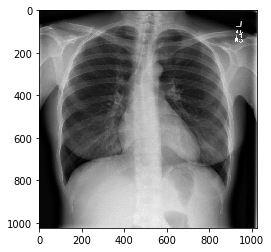

True: No Finding, Predict: No Finding, confident: 0.24636757
Image :  sample/images/00011405_000.png
View :  PA


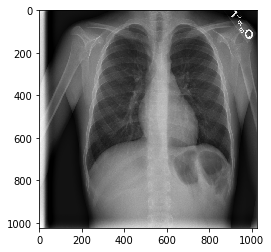

True: No Finding, Predict: No Finding, confident: 0.11307283
Image :  sample/images/00004203_000.png
View :  PA


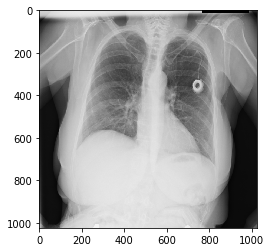

True: No Finding, Predict: No Finding, confident: 0.18643105
Image :  sample/images/00022596_006.png
View :  AP


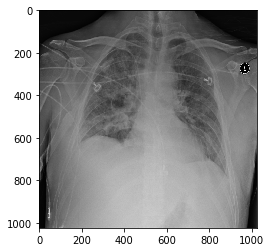

True: Atelectasis, Predict: Finding, confident: 0.74382395
Image :  sample/images/00018387_016.png
View :  AP


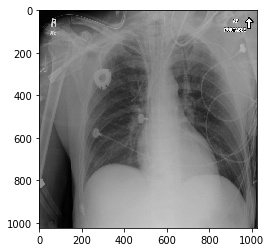

True: No Finding, Predict: No Finding, confident: 0.1949655
Image :  sample/images/00007007_016.png
View :  AP


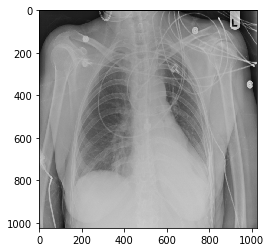

True: Consolidation|Pneumonia, Predict: Finding, confident: 0.76400906
Image :  sample/images/00011744_000.png
View :  PA


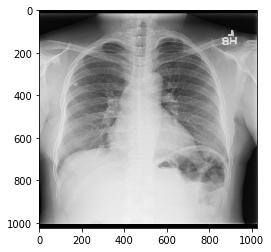

True: No Finding, Predict: No Finding, confident: 0.10714723
Image :  sample/images/00013670_054.png
View :  AP


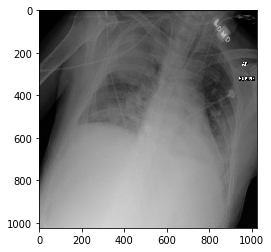

True: Consolidation|Infiltration, Predict: Finding, confident: 0.7579035
Image :  sample/images/00025295_002.png
View :  PA


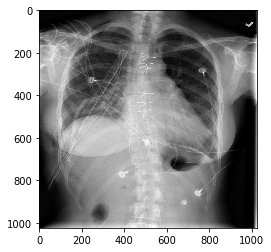

True: Emphysema, Predict: Finding, confident: 0.7325562
Image :  sample/images/00015236_000.png
View :  PA


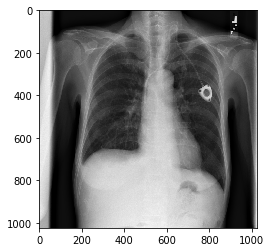

True: Effusion, Predict: Finding, confident: 0.5477153
Image :  sample/images/00016972_004.png
View :  AP


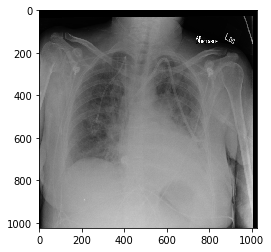

True: Consolidation, Predict: Finding, confident: 0.81745523
Image :  sample/images/00029721_000.png
View :  AP


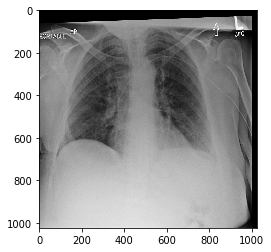

True: No Finding, Predict: No Finding, confident: 0.16538307
Image :  sample/images/00025954_018.png
View :  PA


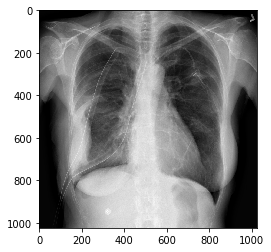

True: Pleural_Thickening|Pneumothorax, Predict: Finding, confident: 0.6462303
Image :  sample/images/00026336_001.png
View :  PA


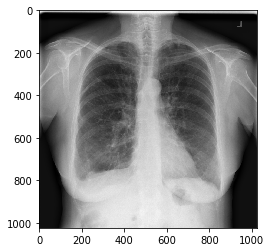

True: Fibrosis|Pleural_Thickening, Predict: Finding, confident: 0.5946921
Image :  sample/images/00002816_001.png
View :  PA


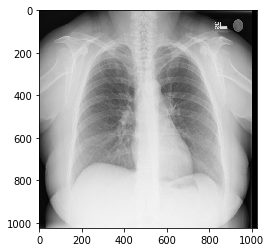

True: No Finding, Predict: No Finding, confident: 0.10422292
Image :  sample/images/00016142_050.png
View :  PA


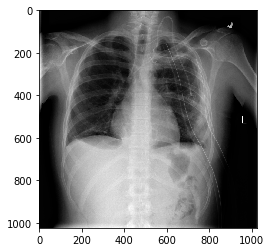

True: Effusion, Predict: Finding, confident: 0.7108379
Image :  sample/images/00027912_008.png
View :  PA


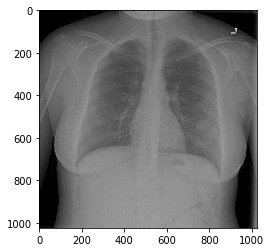

True: No Finding, Predict: No Finding, confident: 0.14797808
Image :  sample/images/00025233_000.png
View :  PA


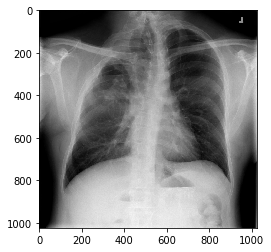

True: No Finding, Predict: No Finding, confident: 0.3635094
Image :  sample/images/00010723_006.png
View :  PA


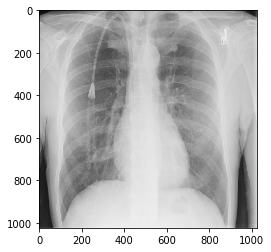

True: No Finding, Predict: No Finding, confident: 0.19218615
Image :  sample/images/00006024_007.png
View :  PA


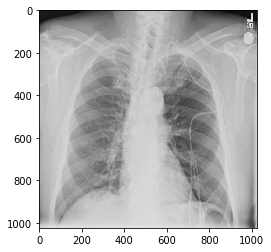

True: No Finding, Predict: No Finding, confident: 0.24339972
Image :  sample/images/00021782_027.png
View :  AP


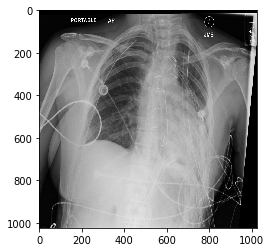

True: Pneumothorax, Predict: Finding, confident: 0.6978055
Image :  sample/images/00016991_013.png
View :  AP


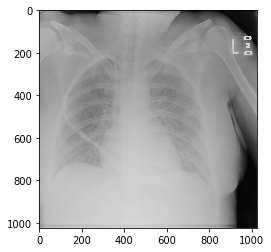

True: No Finding, Predict: No Finding, confident: 0.41952655
Image :  sample/images/00005478_000.png
View :  PA


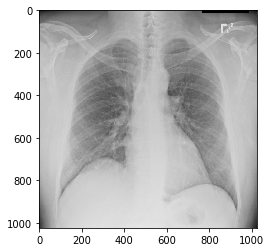

True: No Finding, Predict: No Finding, confident: 0.13892017
Image :  sample/images/00007500_001.png
View :  AP


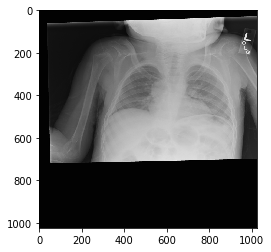

True: Atelectasis, Predict: Finding, confident: 0.53695285
Image :  sample/images/00012659_036.png
View :  AP


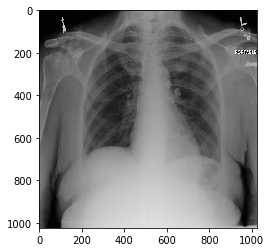

True: No Finding, Predict: No Finding, confident: 0.1493088
Image :  sample/images/00025718_001.png
View :  PA


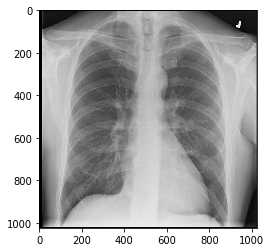

True: No Finding, Predict: No Finding, confident: 0.24564373
Image :  sample/images/00026970_002.png
View :  PA


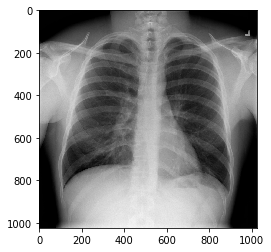

True: No Finding, Predict: No Finding, confident: 0.19159536
Image :  sample/images/00019089_002.png
View :  PA


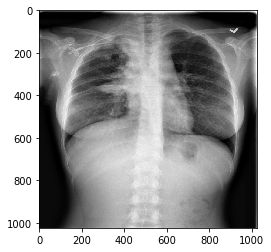

True: Mass|Nodule, Predict: Finding, confident: 0.8484165
Image :  sample/images/00004008_000.png
View :  PA


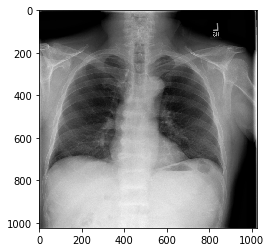

True: No Finding, Predict: No Finding, confident: 0.20064014
Image :  sample/images/00016298_001.png
View :  PA


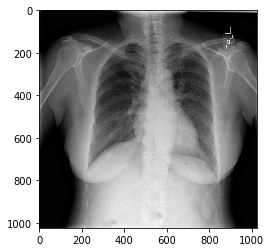

True: No Finding, Predict: No Finding, confident: 0.269092
Image :  sample/images/00007417_005.png
View :  PA


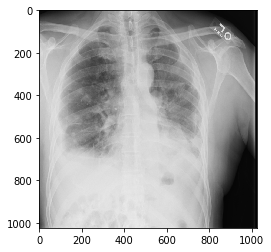

True: Mass, Predict: Finding, confident: 0.7378229
Image :  sample/images/00015606_039.png
View :  AP


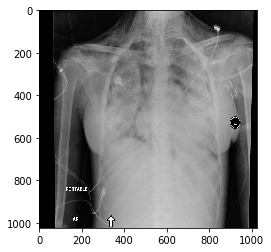

True: Pneumothorax, Predict: Finding, confident: 0.7365314
Image :  sample/images/00025761_001.png
View :  AP


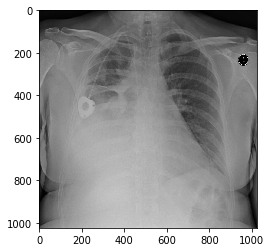

True: Effusion|Mass, Predict: Finding, confident: 0.82087535
Image :  sample/images/00025033_000.png
View :  PA


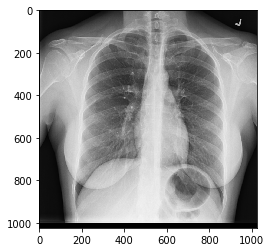

True: No Finding, Predict: No Finding, confident: 0.105107196
Image :  sample/images/00014207_000.png
View :  PA


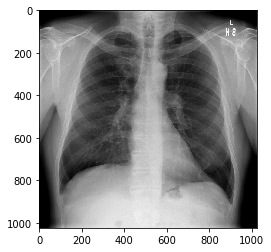

True: No Finding, Predict: No Finding, confident: 0.15143657
Image :  sample/images/00004858_086.png
View :  PA


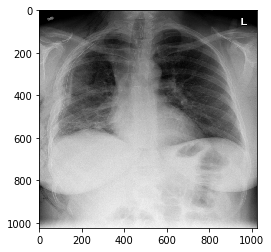

True: Emphysema|Pneumothorax, Predict: Finding, confident: 0.6943974
Image :  sample/images/00026836_001.png
View :  AP


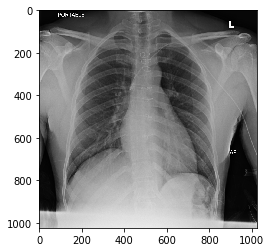

True: No Finding, Predict: No Finding, confident: 0.115548834
Image :  sample/images/00007356_002.png
View :  PA


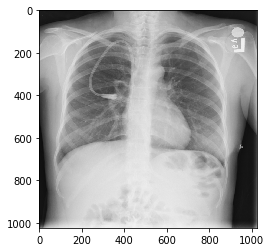

True: No Finding, Predict: No Finding, confident: 0.08776255
Image :  sample/images/00014529_001.png
View :  AP


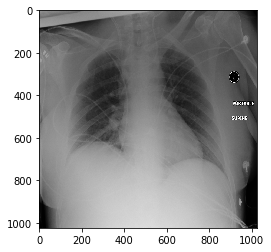

True: No Finding, Predict: No Finding, confident: 0.15718699
Image :  sample/images/00025253_001.png
View :  PA


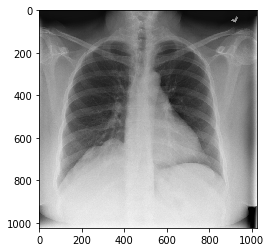

True: No Finding, Predict: No Finding, confident: 0.3264472
Image :  sample/images/00023498_006.png
View :  PA


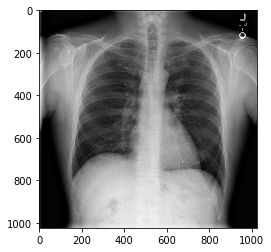

True: No Finding, Predict: No Finding, confident: 0.16438423
Image :  sample/images/00013999_005.png
View :  PA


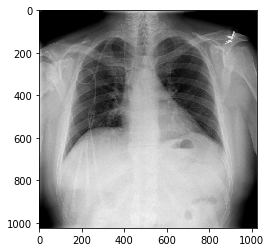

True: No Finding, Predict: No Finding, confident: 0.25866386
Image :  sample/images/00013539_001.png
View :  PA


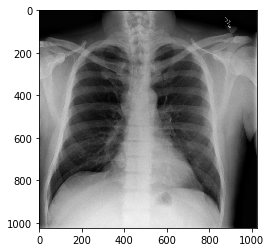

True: No Finding, Predict: No Finding, confident: 0.17731537
Image :  sample/images/00014688_001.png
View :  PA


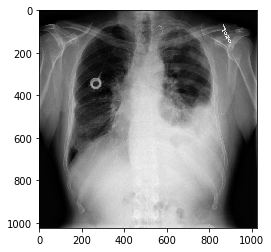

True: Effusion|Mass, Predict: Finding, confident: 0.82846373
Image :  sample/images/00025087_000.png
View :  PA


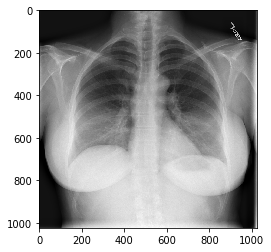

True: No Finding, Predict: No Finding, confident: 0.20431021
Image :  sample/images/00018436_000.png
View :  PA


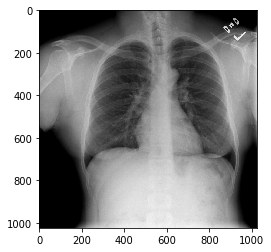

True: No Finding, Predict: No Finding, confident: 0.11406749
Image :  sample/images/00027782_002.png
View :  PA


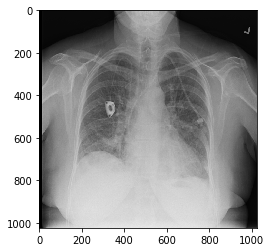

True: Edema, Predict: Finding, confident: 0.75121033
Image :  sample/images/00021495_007.png
View :  PA


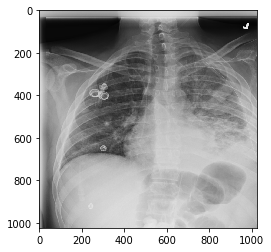

True: Atelectasis|Effusion|Emphysema|Infiltration, Predict: Finding, confident: 0.63427365
Image :  sample/images/00011402_016.png
View :  PA


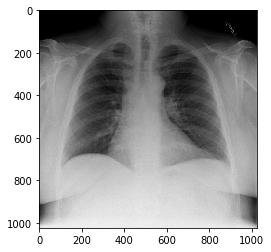

True: No Finding, Predict: No Finding, confident: 0.17034864
Image :  sample/images/00002457_002.png
View :  PA


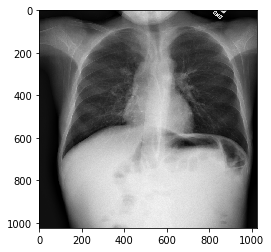

True: No Finding, Predict: No Finding, confident: 0.2233482
Image :  sample/images/00026843_001.png
View :  AP


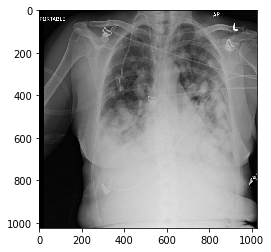

True: Effusion|Mass, Predict: Finding, confident: 0.8125721
Image :  sample/images/00005643_001.png
View :  AP


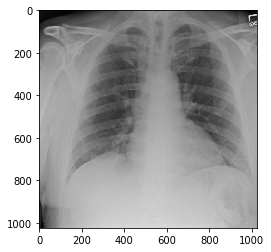

True: No Finding, Predict: No Finding, confident: 0.17598899
Image :  sample/images/00025993_000.png
View :  AP


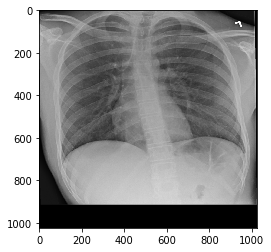

True: No Finding, Predict: No Finding, confident: 0.06311419
Image :  sample/images/00006522_001.png
View :  PA


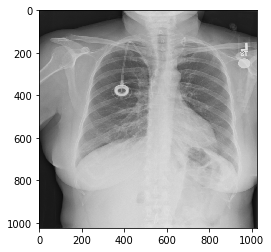

True: No Finding, Predict: No Finding, confident: 0.3467552
Image :  sample/images/00017641_008.png
View :  AP


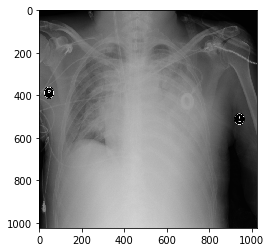

True: Consolidation|Effusion|Infiltration|Mass, Predict: Finding, confident: 0.72958493
Image :  sample/images/00015616_001.png
View :  PA


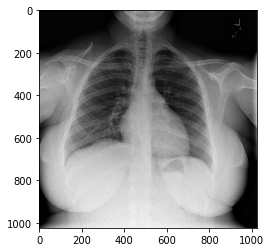

True: No Finding, Predict: No Finding, confident: 0.17877024
Image :  sample/images/00011702_029.png
View :  AP


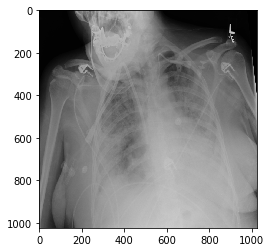

True: Atelectasis|Consolidation|Infiltration|Pneumothorax, Predict: Finding, confident: 0.78484434
Image :  sample/images/00009482_000.png
View :  PA


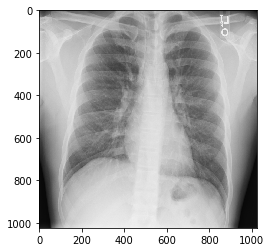

True: No Finding, Predict: No Finding, confident: 0.14526337
Image :  sample/images/00023057_000.png
View :  PA


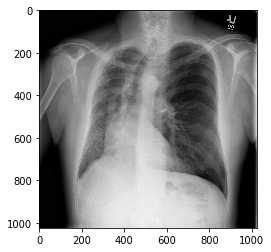

True: Infiltration, Predict: Finding, confident: 0.70048386
Image :  sample/images/00015895_003.png
View :  AP


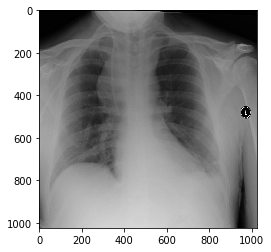

True: Atelectasis|Effusion|Mass, Predict: Finding, confident: 0.6378866
Image :  sample/images/00014356_015.png
View :  AP


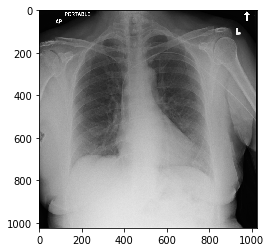

True: No Finding, Predict: No Finding, confident: 0.1771801
Image :  sample/images/00005723_007.png
View :  AP


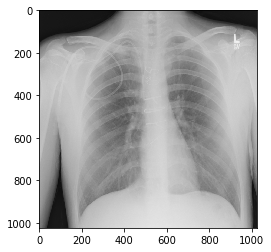

True: No Finding, Predict: No Finding, confident: 0.05899548
Image :  sample/images/00017555_002.png
View :  PA


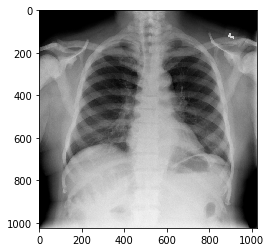

True: No Finding, Predict: No Finding, confident: 0.17998575
Image :  sample/images/00002533_003.png
View :  AP


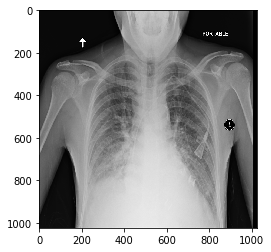

True: Edema, Predict: Finding, confident: 0.8011627
Image :  sample/images/00016211_007.png
View :  PA


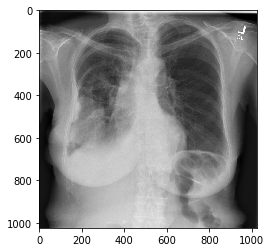

True: Effusion, Predict: Finding, confident: 0.6012387
Image :  sample/images/00015414_006.png
View :  PA


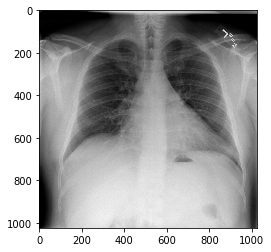

True: No Finding, Predict: No Finding, confident: 0.17997476
Image :  sample/images/00008903_000.png
View :  PA


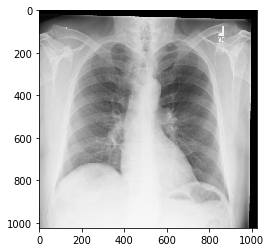

True: No Finding, Predict: No Finding, confident: 0.30186325
Image :  sample/images/00025181_006.png
View :  PA


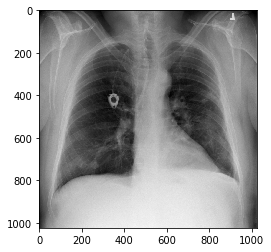

True: Infiltration, Predict: Finding, confident: 0.5613259
Image :  sample/images/00028477_000.png
View :  PA


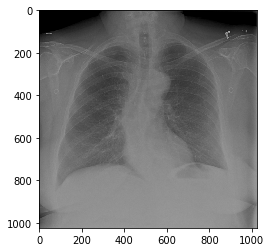

True: No Finding, Predict: No Finding, confident: 0.30081213
Image :  sample/images/00030410_000.png
View :  PA


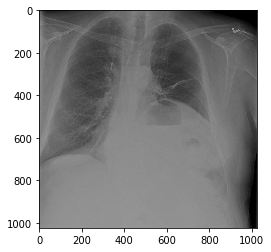

True: Atelectasis, Predict: Finding, confident: 0.57727474
Image :  sample/images/00014201_004.png
View :  AP


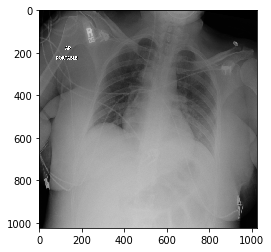

True: No Finding, Predict: No Finding, confident: 0.26000053
Image :  sample/images/00011683_049.png
View :  AP


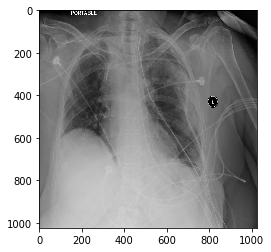

True: No Finding, Predict: No Finding, confident: 0.3337595
Image :  sample/images/00002673_019.png
View :  AP


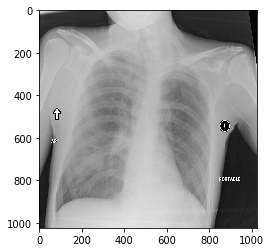

True: No Finding, Predict: No Finding, confident: 0.37117845
Image :  sample/images/00004342_051.png
View :  AP


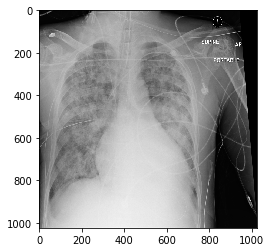

True: Pneumothorax, Predict: Finding, confident: 0.858386
Image :  sample/images/00010513_001.png
View :  AP


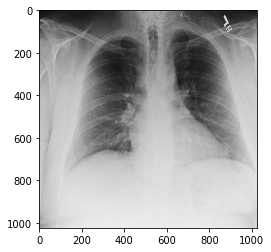

True: No Finding, Predict: No Finding, confident: 0.40623847
Image :  sample/images/00017972_040.png
View :  AP


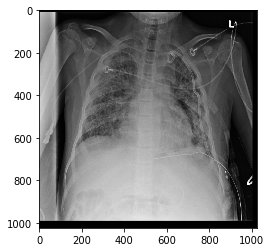

True: Pleural_Thickening, Predict: Finding, confident: 0.7085121
Image :  sample/images/00019981_002.png
View :  AP


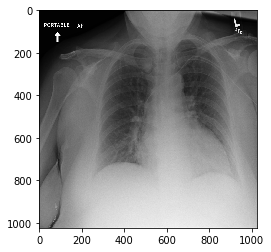

True: No Finding, Predict: No Finding, confident: 0.37942964
Image :  sample/images/00002288_007.png
View :  PA


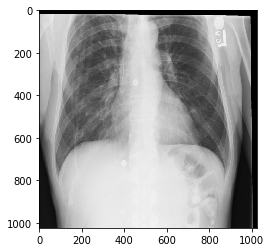

True: No Finding, Predict: No Finding, confident: 0.20099615
Image :  sample/images/00008335_000.png
View :  PA


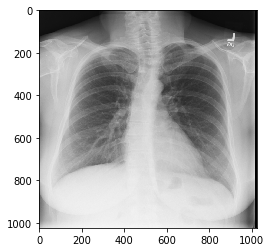

True: No Finding, Predict: No Finding, confident: 0.08326795
Image :  sample/images/00015351_001.png
View :  AP


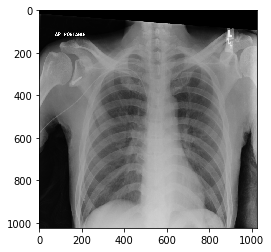

True: No Finding, Predict: No Finding, confident: 0.075909846
Image :  sample/images/00015530_065.png
View :  AP


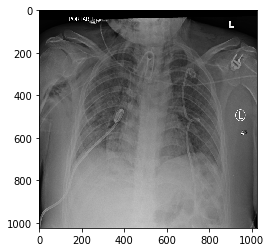

True: Emphysema, Predict: Finding, confident: 0.7721916
Image :  sample/images/00006329_014.png
View :  AP


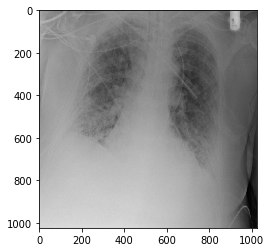

True: Infiltration, Predict: Finding, confident: 0.6610723
Image :  sample/images/00013625_048.png
View :  AP


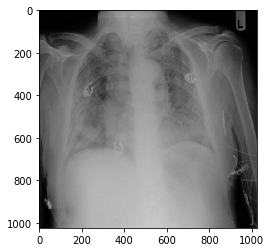

True: Infiltration, Predict: Finding, confident: 0.7694081
Image :  sample/images/00010531_010.png
View :  AP


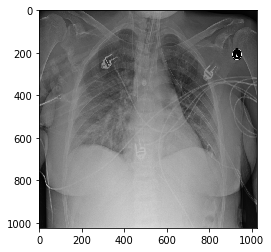

True: No Finding, Predict: No Finding, confident: 0.44185182
Image :  sample/images/00017747_019.png
View :  PA


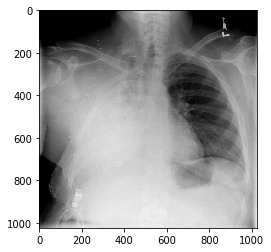

True: No Finding, Predict: No Finding, confident: 0.4463868
Image :  sample/images/00015530_152.png
View :  AP


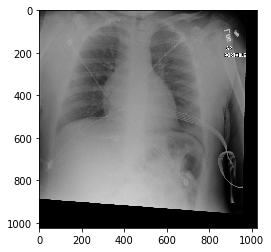

True: No Finding, Predict: No Finding, confident: 0.40414757
Image :  sample/images/00018204_002.png
View :  AP


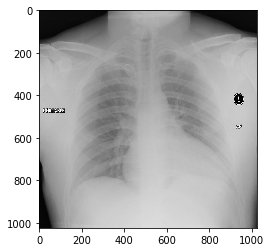

True: No Finding, Predict: No Finding, confident: 0.35425642
Image :  sample/images/00012291_012.png
View :  AP


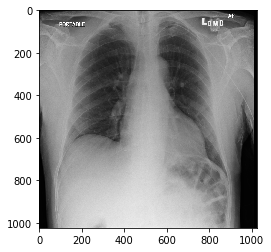

True: No Finding, Predict: No Finding, confident: 0.12980975
Image :  sample/images/00005395_007.png
View :  PA


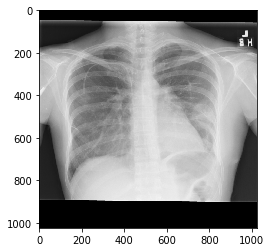

True: Pneumothorax, Predict: Finding, confident: 0.665706
Image :  sample/images/00021618_019.png
View :  PA


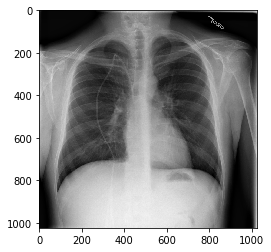

True: No Finding, Predict: No Finding, confident: 0.17540777
Image :  sample/images/00020326_058.png
View :  AP


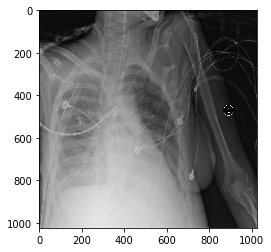

True: Effusion|Infiltration, Predict: Finding, confident: 0.7734259
Image :  sample/images/00017151_012.png
View :  PA


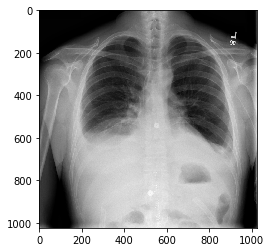

True: Atelectasis|Effusion, Predict: Finding, confident: 0.91265774
Image :  sample/images/00014149_035.png
View :  AP


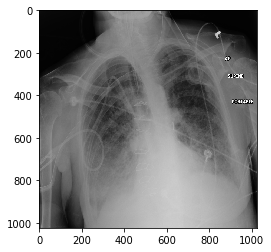

True: Infiltration, Predict: Finding, confident: 0.86228603
Image :  sample/images/00002639_010.png
View :  PA


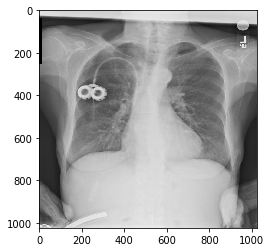

True: No Finding, Predict: No Finding, confident: 0.22697239
Image :  sample/images/00010452_000.png
View :  AP


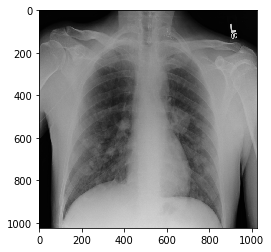

True: No Finding, Predict: No Finding, confident: 0.19819173
Image :  sample/images/00020326_005.png
View :  PA


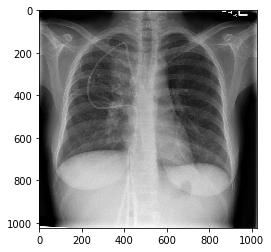

True: Consolidation|Mass, Predict: Finding, confident: 0.80891573
Image :  sample/images/00014663_023.png
View :  AP


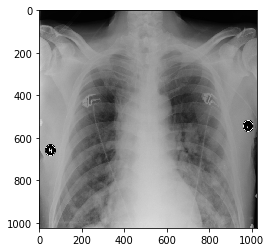

True: Mass, Predict: Finding, confident: 0.6069064
Image :  sample/images/00021201_027.png
View :  AP


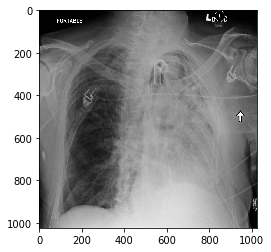

True: Infiltration, Predict: Finding, confident: 0.67254746
Image :  sample/images/00013625_005.png
View :  PA


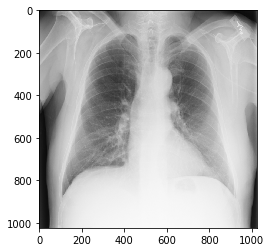

True: No Finding, Predict: No Finding, confident: 0.20572199
Image :  sample/images/00004342_016.png
View :  AP


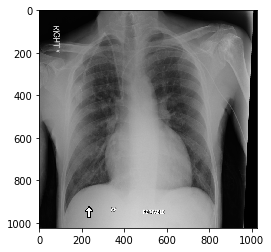

True: No Finding, Predict: No Finding, confident: 0.44466949
Image :  sample/images/00011831_007.png
View :  PA


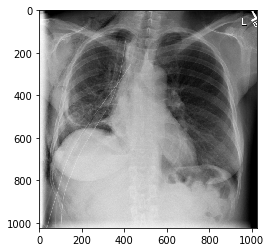

True: Pneumothorax, Predict: Finding, confident: 0.6065474
Image :  sample/images/00017846_004.png
View :  PA


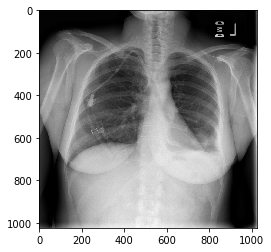

True: Pleural_Thickening, Predict: Finding, confident: 0.6417601
Image :  sample/images/00015915_009.png
View :  PA


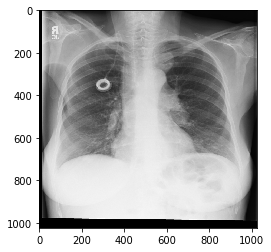

True: No Finding, Predict: No Finding, confident: 0.34701526
Image :  sample/images/00017709_002.png
View :  PA


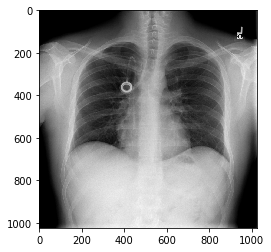

True: No Finding, Predict: No Finding, confident: 0.2274666
Image :  sample/images/00027861_001.png
View :  PA


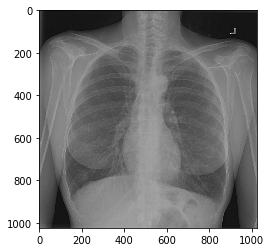

True: No Finding, Predict: No Finding, confident: 0.13986266
Image :  sample/images/00020838_000.png
View :  PA


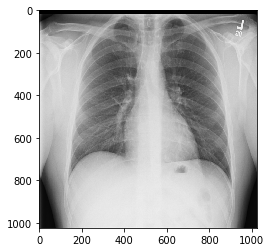

True: No Finding, Predict: No Finding, confident: 0.123208724
Image :  sample/images/00008008_068.png
View :  PA


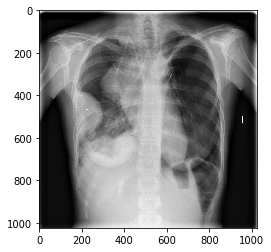

True: Infiltration, Predict: Finding, confident: 0.7643118
Image :  sample/images/00007808_001.png
View :  PA


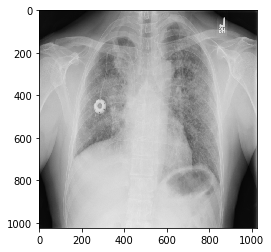

True: Effusion|Mass|Nodule, Predict: Finding, confident: 0.6687675


In [24]:
df = pd.read_csv('sample/sample_labels.csv').sample(300)

for i in range(len(df)):
    img, age, gender, view = 'sample/images/' + df.iloc[i]['Image Index'], df.iloc[i]['Patient Age'], df.iloc[i]['Patient Gender'], df.iloc[i]['View Position']
    pre = predict(img, age, gender, view)[0][0]
    y_true = df.iloc[i]['Finding Labels']
    y_predict = "Finding" if (pre >= 0.5) else "No Finding"
    if y_true == y_predict or (y_predict == "Finding" and y_true != "No Finding"):
        print("Image : " , img)
        print("View : " , view)
        show_image(img)
        print ("True: %s, Predict: %s, confident: %s" % (y_true, y_predict, pre))